# # **Classify Diseases in Apple Trees.**

Apples are one of the most important temperate fruit crops in the world. Foliar (leaf) diseases pose a major threat to the overall productivity and quality of apple orchards. The current process for disease diagnosis in apple orchards is based on manual scouting by humans, which is time-consuming and expensive.

The main objective of this project is to develop machine learning-based models to accurately classify a given leaf image from the test dataset to a particular disease category, and to identify an individual disease from multiple disease symptoms on a single leaf image.


**1. Libraries**

In [2]:
##### 1
import gc
import re

import cv2
import math
import numpy as np
import scipy as sp
import pandas as pd
import pickle

import tensorflow as tf
from IPython.display import SVG
#import efficientnet.tfkeras as efn
from tensorflow.keras.utils import plot_model
import tensorflow.keras.layers as L
#from tensorflow.keras.utils import model_to_dot
import tensorflow.keras.backend as K
from tensorflow.keras.models import Model
#from kaggle_datasets import KaggleDatasets
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications import ResNet50V2

import seaborn as sns
from tqdm import tqdm
import matplotlib.cm as cm
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix as cmx


tqdm.pandas()
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

np.random.seed(0)
tf.random.set_seed(0)

import warnings
warnings.filterwarnings("ignore")

import os

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense,Activation,Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping

**2. About Dataset**

In [5]:
### paths declaration

EPOCHS = 20
SAMPLE_LEN = 100
train_impath = 'plant-pathology-2021-fgvc8/train_images/'
#train_impath = 'Dataset/'
train_data = pd.read_csv('train.csv')
#df_data = pd.read_csv('train_new.csv')
df_train = pd.read_csv('train.csv')
train_image_path='plant-pathology-2021-fgvc8/train_images/'
df_test=pd.read_csv('plant-pathology-2021-fgvc8/sample_submission.csv')
test_image_path='plant-pathology-2021-fgvc8/test_images/'

In [25]:
### counting values of different labels
df_train.labels.value_counts()

scab                               4826
healthy                            4624
frog_eye_leaf_spot                 3181
rust                               1860
complex                            1602
powdery_mildew                     1184
scab frog_eye_leaf_spot             686
scab frog_eye_leaf_spot complex     200
frog_eye_leaf_spot complex          165
rust frog_eye_leaf_spot             120
rust complex                         97
powdery_mildew complex               87
Name: labels, dtype: int64

**3. Batch Visualisation of Images**

<AxesSubplot:xlabel='labels', ylabel='Count'>

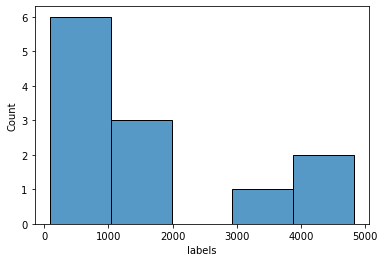

In [26]:
### projecting histogram plot against values

sns.histplot(df_train['labels'].value_counts(sort=True))

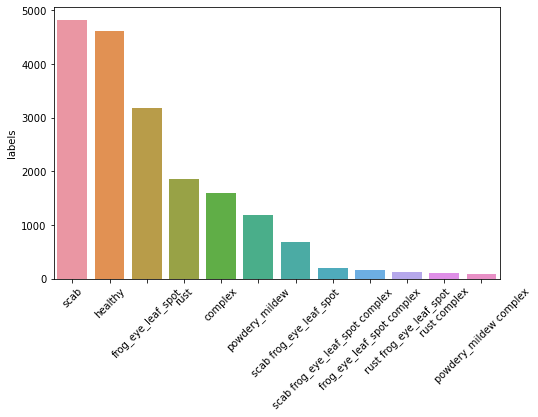

In [5]:
### projecting histogram plot against values

plt.figure(figsize=(8,5))
labels = sns.barplot(df_train.labels.value_counts().index,df_train.labels.value_counts())
for item in labels.get_xticklabels():
    item.set_rotation(45)

In [16]:
### pie chart for the labels

source = df_train['labels'].value_counts()
fig = go.Figure(data=[go.Pie(labels=source.index, values=source.values)])
fig.update_layout(title='Label Distribution')
fig.show()

**4. Batch visualisation with labels**

In [17]:
##### plant pathology
import csv
def visualize_batch(path,image_ids, labels):
    plt.figure(figsize=(16, 12))
    try:
        for ind, (image_id, label) in enumerate(zip(image_ids, labels)):
            plt.subplot(3, 3, ind + 1)
            image_path=os.path.join(path, image_id)
            image=plt.imread(image_path)
            image.shape
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            plt.imshow(image)
            plt.title(f"Class: {label}", fontsize=12)
            plt.axis("off")
        plt.show()
    except:
        pass
        #

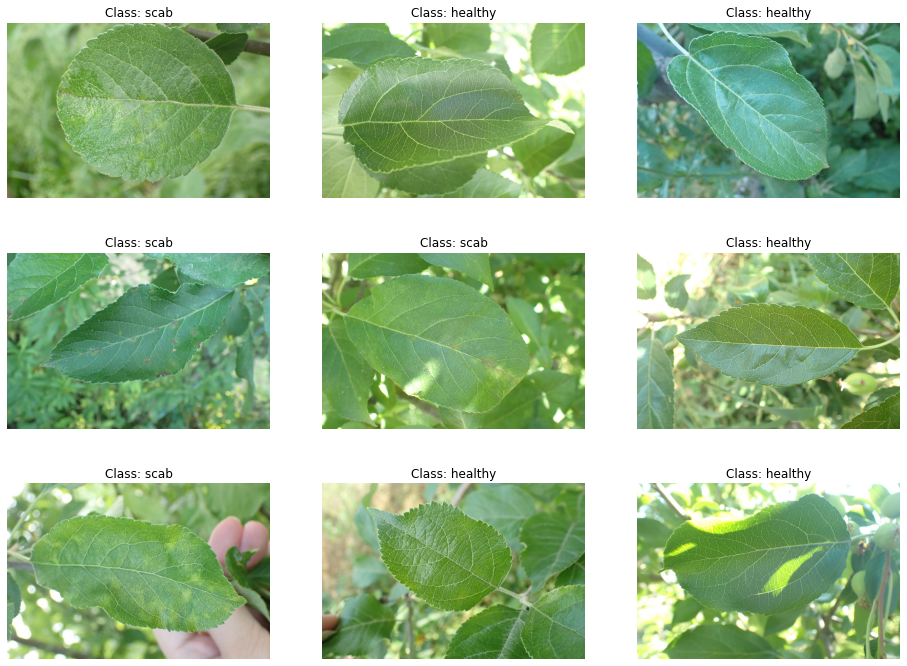

In [10]:
tmp_df = train_data.sample(9)
image_ids = tmp_df["image"].values
labels = tmp_df["labels"].values
visualize_batch(train_impath,image_ids,labels)

In [19]:
### converting BGR value to RGB Format

SAMPLE_LENGTH = 50

def load_image(image_id):
    file_path = image_id
    img = cv2.imread(train_impath+'/'+file_path)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


train_images = train_data['image'][:SAMPLE_LENGTH].apply(load_image)

In [20]:
### getting red, green and blue values from the sample images

red_values = [np.mean(train_images[idx][:, :, 0]) for idx in range(len(train_images))]
green_values = [np.mean(train_images[idx][:, :, 1]) for idx in range(len(train_images))]
blue_values = [np.mean(train_images[idx][:, :, 2]) for idx in range(len(train_images))]
values = [np.mean(train_images[idx]) for idx in range(len(train_images))]

In [21]:
### projection of red chanel values

fig = ff.create_distplot([red_values], group_labels=["R"], colors=["red"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Distribution of red channel values")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

In [22]:
### projection of green chanel values

fig = ff.create_distplot([green_values], group_labels=["G"], colors=["green"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Distribution of green channel values")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

In [24]:
### projection of blue chanel values

fig = ff.create_distplot([blue_values], group_labels=["B"], colors=["blue"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Distribution of blue channel values")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

In [41]:
def batch_visualize_with_label(df,batch_size,path,label): 
    sample_df = df_train[df_train["labels"]==label].sample(9)
    image_names = sample_df["image"].values
    labels = sample_df["labels"].values
    plt.figure(figsize=(16, 12))
    
    for image_ind, (image_name, label) in enumerate(zip(image_names, labels)):
        plt.subplot(3, 3, image_ind + 1)
        image = cv2.imread(os.path.join(path, image_name))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.imshow(image)
        plt.axis("off")
    plt.show()

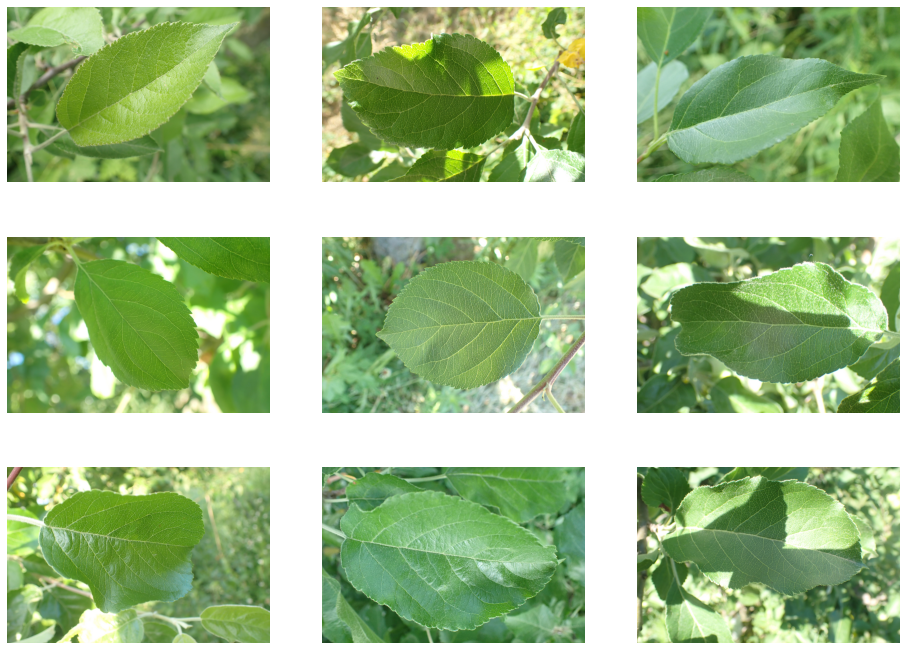

In [42]:
batch_visualize_with_label(df_train,9,train_impath,'healthy')

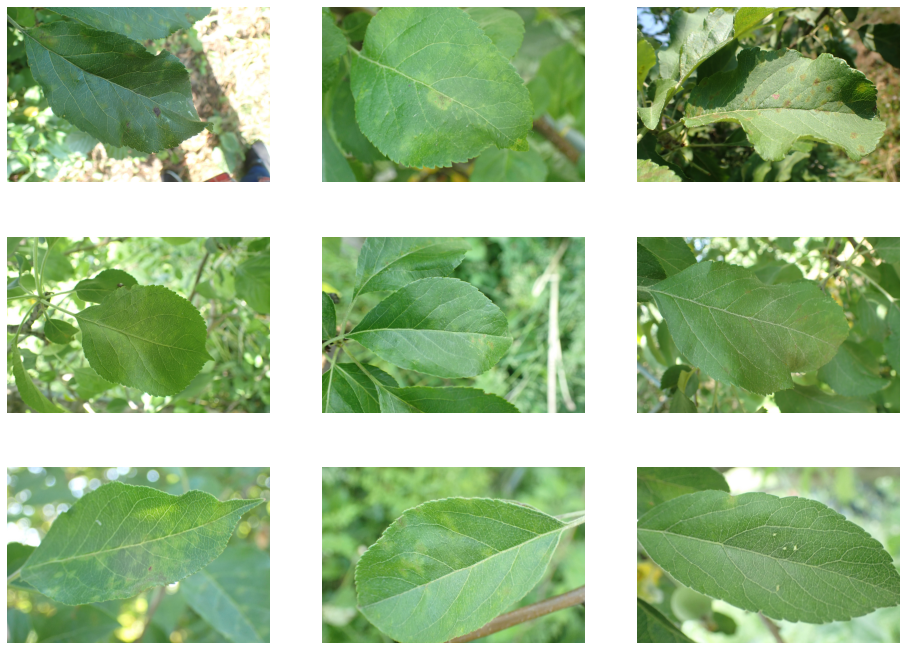

In [43]:
batch_visualize_with_label(df_train,9,train_image_path,'scab')

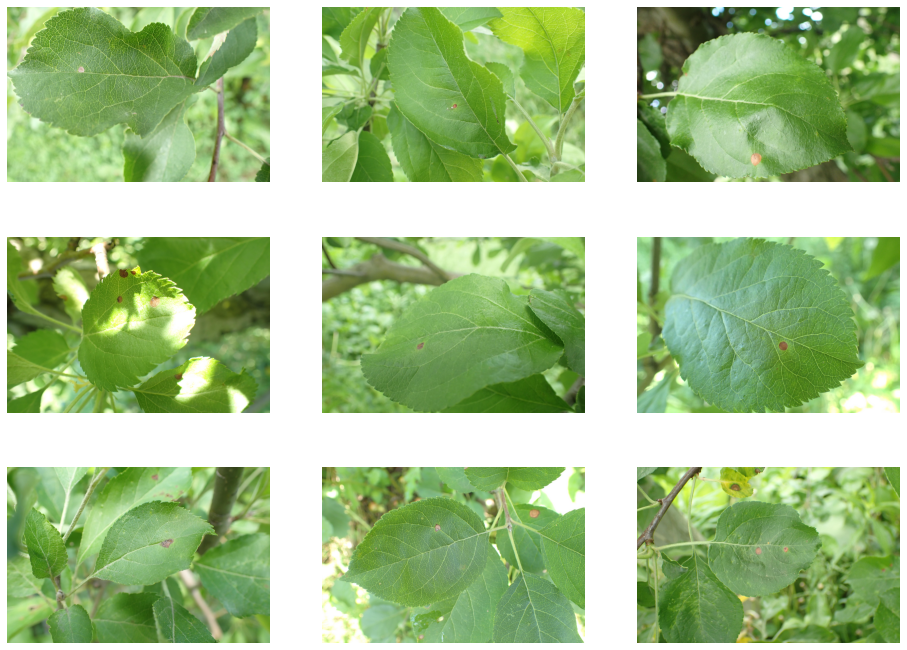

In [44]:
batch_visualize_with_label(df_train,9,train_image_path,'frog_eye_leaf_spot')

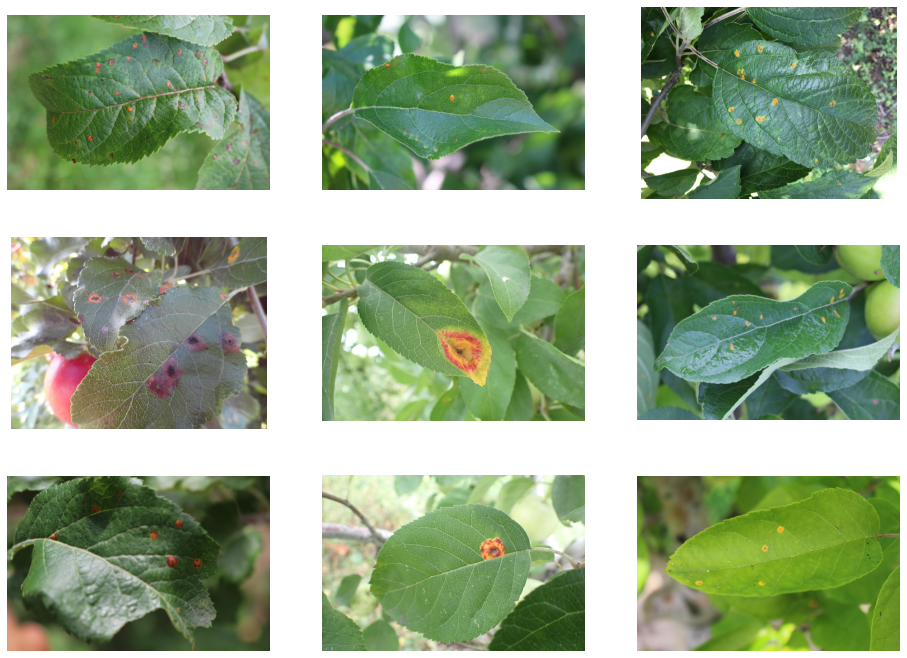

In [45]:
batch_visualize_with_label(df_train,9,train_image_path,'rust')

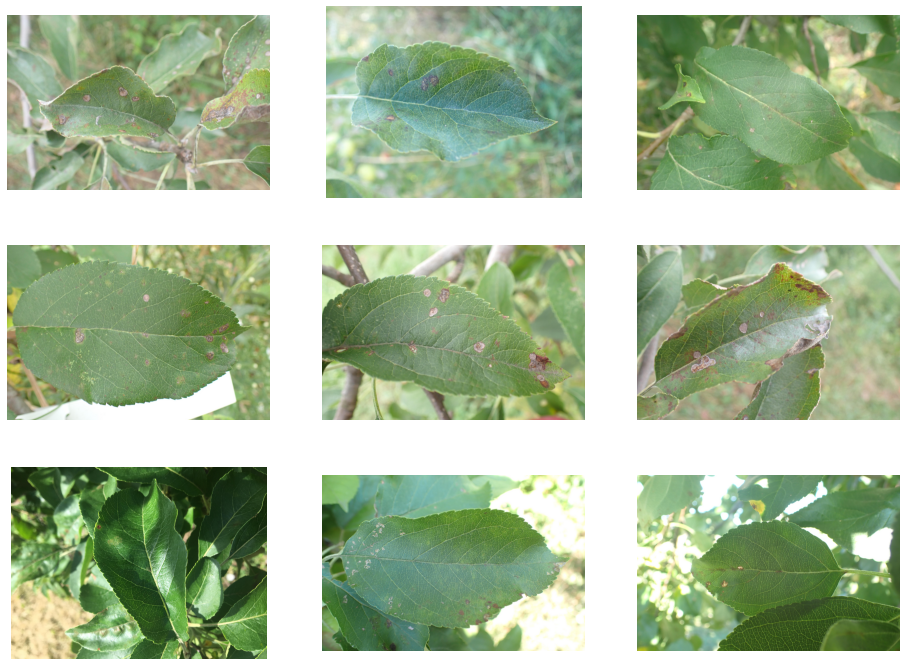

In [46]:
batch_visualize_with_label(df_train,9,train_image_path,'complex')

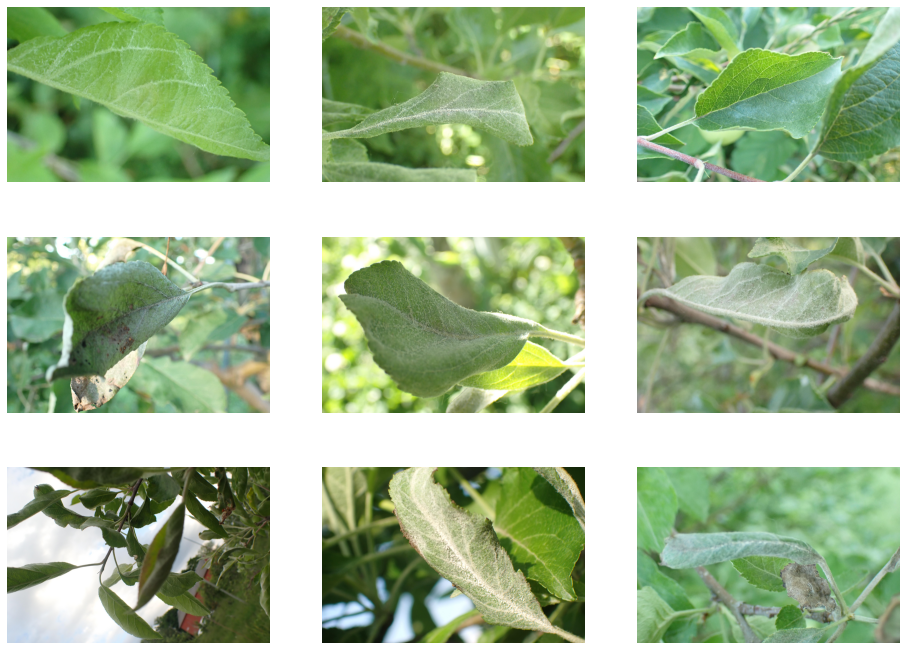

In [47]:
batch_visualize_with_label(df_train,9,train_image_path,'powdery_mildew')

**Tensorflow Dataset Generation**

In [9]:
HEIGHT = 128
WIDTH=128
SEED = 45
BATCH_SIZE= 64

train_datagen = ImageDataGenerator(rescale = 1/255.,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    validation_split = 0.2,
    zoom_range = 0.2,
    shear_range = 0.2,
    vertical_flip = False)

train_dataset = train_datagen.flow_from_dataframe(
    df_train,
    directory = train_image_path,
    x_col = "image",
    y_col = "labels",
    target_size = (HEIGHT,WIDTH),
    class_mode='categorical',
    batch_size = BATCH_SIZE,
    subset = "training",
    shuffle = True,
    seed = SEED,
    validate_filenames = False
)


validation_dataset = train_datagen.flow_from_dataframe(
    df_train,
    directory = train_image_path,
    x_col = "image",
    y_col = "labels",
    target_size = (HEIGHT,WIDTH),
    class_mode='categorical',
    batch_size = BATCH_SIZE,
    subset = "validation",
    shuffle = True,
    seed = SEED,
    validate_filenames = False
)

test_datagen = ImageDataGenerator(
    rescale = 1./255
)
INPUT_SIZE = (HEIGHT,WIDTH,3)
test_dataset=test_datagen.flow_from_dataframe(
    df_test,
    directory=test_image_path,
    x_col='image',
    y_col=None,
    class_mode=None,
    target_size=INPUT_SIZE[:2]
)

Found 14906 non-validated image filenames belonging to 12 classes.
Found 3726 non-validated image filenames belonging to 12 classes.
Found 3 validated image filenames.


**Convolutional Neural Networks**

In [10]:
model=Sequential()
model.add(Conv2D(32,(3,3),activation='relu',padding='same',input_shape=(HEIGHT,WIDTH,3)))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(64,(3,3),activation='relu',padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(64,(10,10),activation='relu',padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(128,(3,3),activation='relu',padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Flatten())
model.add(Dense(12,activation='softmax'))

In [11]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy'])
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 128, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 64, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 64)        409664    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 16, 128)      

In [10]:
checkpoint_path = "training_2/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

In [11]:
model_history=model.fit_generator(train_dataset,
                                  validation_data=validation_dataset,
                                  epochs=70,
                                  steps_per_epoch=train_dataset.samples//128,
                                 validation_steps=validation_dataset.samples//128,
                                 callbacks=[cp_callback]
                                 )

Epoch 1/70
116/116 [==============================] - 1860s 16s/step - loss: 1.8966 - accuracy: 0.2625 - val_loss: 1.8310 - val_accuracy: 0.3244

Epoch 00001: saving model to training_2\cp.ckpt
Epoch 2/70
116/116 [==============================] - 1667s 14s/step - loss: 1.7535 - accuracy: 0.3280 - val_loss: 1.7471 - val_accuracy: 0.3718

Epoch 00002: saving model to training_2\cp.ckpt
Epoch 3/70
116/116 [==============================] - 1879s 16s/step - loss: 1.6488 - accuracy: 0.3758 - val_loss: 1.6092 - val_accuracy: 0.3825

Epoch 00003: saving model to training_2\cp.ckpt
Epoch 4/70
116/116 [==============================] - 2204s 19s/step - loss: 1.6019 - accuracy: 0.4023 - val_loss: 1.4992 - val_accuracy: 0.4467

Epoch 00004: saving model to training_2\cp.ckpt
Epoch 5/70
116/116 [==============================] - 3533s 31s/step - loss: 1.4895 - accuracy: 0.4518 - val_loss: 1.4222 - val_accuracy: 0.4957

Epoch 00005: saving model to training_2\cp.ckpt
Epoch 6/70
116/116 [==========

KeyboardInterrupt: 

**Prediction**

In [12]:
train_dataset.class_indices.items()

dict_items([('complex', 0), ('frog_eye_leaf_spot', 1), ('frog_eye_leaf_spot complex', 2), ('healthy', 3), ('powdery_mildew', 4), ('powdery_mildew complex', 5), ('rust', 6), ('rust complex', 7), ('rust frog_eye_leaf_spot', 8), ('scab', 9), ('scab frog_eye_leaf_spot', 10), ('scab frog_eye_leaf_spot complex', 11)])

In [13]:
preds = model.predict(test_dataset)
print(preds)

[[0.0818549  0.08617813 0.08425332 0.08838428 0.08519157 0.08335879
  0.08645184 0.08459685 0.08414154 0.08152537 0.07659347 0.07746989]
 [0.08095682 0.08736945 0.08600453 0.09001061 0.08552275 0.08526585
  0.08504995 0.08460693 0.08260783 0.08025055 0.07585024 0.07650452]
 [0.08371036 0.0842426  0.08703977 0.09620704 0.08624213 0.08722611
  0.08715468 0.08328332 0.08176491 0.0761063  0.07260276 0.07441998]]


In [14]:
preds_disease_ind=np.argmax(preds, axis=-1)

In [15]:
preds_disease_ind

array([3, 3, 3], dtype=int64)